# Importing packages

In [1]:
import numpy as np
import xarray as xr
import pickle
import glob, os
from matplotlib import pyplot as plt
plt.close('all')
import h5py
from tqdm import tqdm

# from data_utils import e3sm_preprocessing

%config InlineBackend.figure_format = 'retina'
# plt.rcParams['font.family'] = 'Deja Vu Sans'
# plt.rcParams['font.size'] = 9

In [2]:
!pwd

/ocean/projects/atm200007p/jlin96/neurips_proj/sungduk_main/refactored


In [3]:
data_path = '/ocean/projects/atm200007p/walrus/for_jerry/train/'
norm_path = '/ocean/projects/atm200007p/jlin96/neurips_proj/mooers_metrics/norm_factors/'
grid_path = '/ocean/projects/atm200007p/jlin96/neurips_proj/mooers_metrics/test_data/E3SM-MMF_ne4_grid-info.orig.nc'

In [4]:
mli_mean = xr.open_dataset(norm_path + 'mli_mean.nc')
mli_min = xr.open_dataset(norm_path + 'mli_min.nc')
mli_max = xr.open_dataset(norm_path + 'mli_max.nc')
grid_info = xr.open_dataset(grid_path)

In [5]:
mli_min["state_ps"]

<xarray.DataArray 'state_ps' ()>
array(69598.899331)

In [6]:
sorted(grid_info["lat"].values)

[-82.05885901129312,
 -82.05885901129312,
 -82.05885901129312,
 -82.05885901129312,
 -72.29334396858286,
 -72.29334396858286,
 -72.29334396858286,
 -72.29334396858286,
 -72.29334396858286,
 -72.29334396858286,
 -72.29334396858286,
 -72.29334396858286,
 -66.7332624874399,
 -66.7332624874399,
 -66.7332624874399,
 -66.7332624874399,
 -61.444873961595675,
 -61.444873961595675,
 -61.444873961595675,
 -61.444873961595675,
 -61.444873961595675,
 -61.444873961595675,
 -61.444873961595675,
 -61.444873961595675,
 -58.33006594051071,
 -58.33006594051071,
 -58.33006594051071,
 -58.33006594051071,
 -58.33006594051071,
 -58.33006594051071,
 -58.33006594051071,
 -58.33006594051071,
 -52.70477824128975,
 -52.70477824128975,
 -52.70477824128975,
 -52.70477824128975,
 -50.39289385594161,
 -50.39289385594161,
 -50.39289385594161,
 -50.39289385594161,
 -50.39289385594161,
 -50.39289385594161,
 -50.39289385594161,
 -50.39289385594161,
 -48.711371585494206,
 -48.711371585494206,
 -48.711371585494206,
 -48.7

In [7]:
def get_xrdata(file, var):
    return xr.open_dataset(file, engine = 'netcdf4')[var].values[np.newaxis, :]


In [8]:
figure_ingredients = "/ocean/projects/atm200007p/jlin96/neurips_proj/figure_ingredients/"

In [9]:
with open(figure_ingredients + 'indextolatlons.pkl', 'rb') as f:
    data = pickle.load(f)

with open(figure_ingredients + 'indextolatlontime.pkl', 'rb') as f:
    data2 = pickle.load(f)

In [10]:
len(data)

384

In [11]:
data[382]

(45.338123143119, 146.7225175282831)

In [12]:
data2[384]

[(-32.58502852348108, 320.2708952630019), '0008-02-01-07200']

In [13]:
with open(figure_ingredients + 'indextolatlons.pkl', 'rb') as f:
    data = pickle.load(f)

plt.close('all')
plt.rcParams.update(plt.rcParamsDefault)
plt.rc('font', family='sans')
plt.rcParams.update({'font.size': 32,
                     'lines.linewidth': 2,
                     'axes.labelsize': 32,
                     'axes.titlesize': 32,
                     'xtick.labelsize': 32,
                     'ytick.labelsize': 32,
                     'legend.fontsize': 32,
                     'axes.linewidth': 2,
                     "pgf.texsystem": "pdflatex"
                     })
%config InlineBackend.figure_format = 'retina'

model_name_l = ['cVAE','HSR','RPN','CNN', 'MLP']
n_model = len(model_name_l)

In [14]:
lats_unique = []
lats_unique.append(data[0][0])
long_unique = []
long_unique.append(data[0][1])

for i in range(len(data)-1):
    if not(data[i+1][0] in lats_unique):
        lats_unique.append(data[i+1][0])
    if not(data[i+1][1] in long_unique):
        long_unique.append(data[i+1][1])

Nlats = len(lats_unique) # 87
Nlong = len(long_unique) # 199

ind_lat = []
for i in range(Nlats):
    ind_lat_loc = []
    for j in range(len(data)):
        if data[j][0] == lats_unique[i]:
            ind_lat_loc.append(j)
    ind_lat.append(ind_lat_loc)

lats_unique = np.array(lats_unique)
long_unique = np.array(long_unique)
arg_lats_unique = np.argsort(lats_unique)
arg_long_unique = np.argsort(long_unique)
lats_unique = lats_unique[arg_lats_unique]
long_unique = long_unique[arg_long_unique]


In [15]:
lats_unique2, lats_indices = np.unique(grid_info['lat'].values, return_index=True)
arg_lats_unique2 = np.argsort(grid_info['lat'].values[np.sort(lats_indices)])

In [16]:
lats_unique - lats_unique2

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0.])

In [17]:
arg_lats_unique - arg_lats_unique2

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [18]:
stride_sample = 6
f_mli1 = glob.glob(data_path + '*/E3SM-MMF.mli.0008-0[23456789]-*-*.nc')
f_mli2 = glob.glob(data_path + '*/E3SM-MMF.mli.0008-1[012]-*-*.nc')
f_mli3 = glob.glob(data_path + '*/E3SM-MMF.mli.0009-01-*-*.nc')
f_mli_data = sorted([*f_mli1, *f_mli2, *f_mli3])
f_mli_data = f_mli_data[::stride_sample]
print(f'#files: {len(f_mli_data)}')

#files: 4380


In [19]:
def get_xrdata(file, file_vars):
    '''
    This function reads in a file and returns an xarray dataset with the variables specified.
    '''
    ds = xr.open_dataset(file, engine = 'netcdf4')
    if file_vars != "":
        ds = ds[file_vars]
    ds = ds.merge(grid_info[['lat','lon']])
    ds = ds.where((ds['lat']>-999)*(ds['lat']<999), drop=True)
    ds = ds.where((ds['lon']>-999)*(ds['lon']<999), drop=True)
    return ds

ps = np.concatenate([get_xrdata(file, ['state_ps'])['state_ps'].values[np.newaxis, :] for file in tqdm(f_mli_data)], axis = 0)[:,:,np.newaxis]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4380/4380 [03:01<00:00, 24.13it/s]


In [28]:
print('hi')

hi


In [20]:
ps.shape

(4380, 384, 1)

In [21]:
hyam = grid_info["hyam"].values
hybm = grid_info["hybm"].values

In [22]:
nnhyam = hyam[np.newaxis, np.newaxis, :]
nnhybm = hybm[np.newaxis, np.newaxis, :]

In [23]:
nnps = ps
print(nnhyam.shape)
print(nnhybm.shape)
print(nnps.shape)

(1, 1, 60)
(1, 1, 60)
(4380, 384, 1)


In [47]:
okay = nnhyam * 1e5 + nnps * nnhybm

In [48]:
okay.shape

(4380, 384, 60)

In [24]:
pressure_grid = np.mean(nnhyam * 1e5 + nnps * nnhybm, axis = 0)

In [25]:
print(pressure_grid.shape)


(384, 60)


In [26]:
def find_keys(dictionary, value):
    keys = []
    for key, val in dictionary.items():
        if val[0] == value:
            keys.append(key)
    return keys

In [27]:
pg_lats = []
for lat in lats_unique:
    indices = find_keys(data, lat)
    pg_lats.append(np.mean(pressure_grid[indices, :], axis = 0)[:, np.newaxis])
pg_plotgrid = np.concatenate(pg_lats, axis = 1)

In [38]:
hmm = {i: (grid_info['lat'].values[i%384], grid_info['lon'].values[i%384]) for i in range(384)}

In [46]:
data == hmm

True

In [41]:
pressure_grid.shape

(384, 60)

In [50]:
def get_pressure_grid():
    ps = np.concatenate([get_xrdata(file, ['state_ps'])['state_ps'].values[np.newaxis, :] for file in tqdm(f_mli_data)], axis = 0)[:, :, np.newaxis]
    hyam_component = hyam[np.newaxis, np.newaxis, :]*1e5
    hybm_component = hybm[np.newaxis, np.newaxis, :]*ps

    pressures = np.mean(hyam_component + hybm_component, axis = 0)
    def find_keys(dictionary, value):
        keys = []
        for key, val in dictionary.items():
            if val[0] == value:
                keys.append(key)
        return keys
    pg_lats = []
    for lat in lats_unique:
        indices = find_keys(data, lat)
        pg_lats.append(np.mean(pressures[indices, :], axis = 0)[:, np.newaxis])
    pressure_grid = np.concatenate(pg_lats, axis = 1)
    return pressure_grid

In [51]:
pg_plotgrid2 = get_pressure_grid()

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4380/4380 [00:37<00:00, 117.59it/s]


In [53]:
np.sum(pg_plotgrid - pg_plotgrid2)

0.0

In [55]:
print('hi')

hi


In [43]:
lats_unique.shape

(87,)

In [30]:
test_y = np.load(figure_ingredients + 'val_target_stride6.npy')
test_y = np.array(test_y,dtype=np.float64)

/tmp/ipykernel_66889/831362289.py:59: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  contour_plot = ax[0,i].pcolor(X, Y, coeff,cmap='Blues', vmin = 0, vmax = 1) # pcolormesh
/tmp/ipykernel_66889/831362289.py:66: RuntimeWarning: divide by zero encountered in divide
  coeff = 1 - np.sum( (pred_moist_daily_long-test_moist_daily_long)**2, axis=1)/np.sum( (test_moist_daily_long-np.mean(test_moist_daily_long, axis=1)[:,None,:])**2, axis=1)
/tmp/ipykernel_66889/831362289.py:70: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  contour_plot = ax[1,i].pcolor(X, Y, coeff,cmap='Blues', vmin = 0, vmax = 1) # pcolo

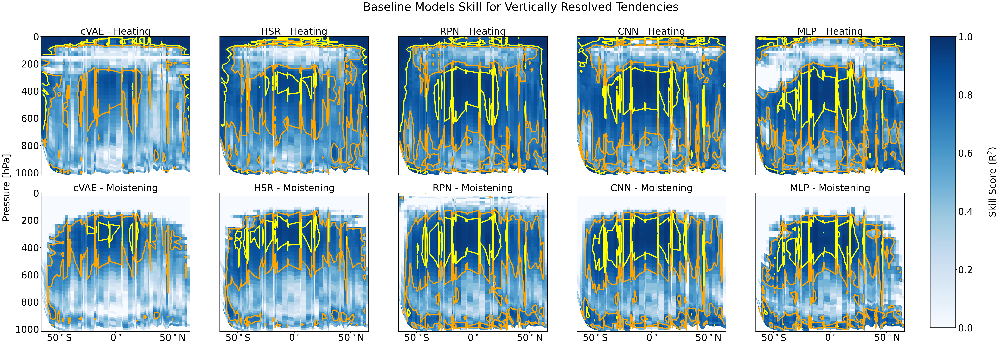

In [54]:
pred_y_l = []

import h5py
hf = h5py.File('/ocean/projects/atm200007p/shared/neurips_proj/final_metrics/predictions/cVAE/cvae_preds_bestcrps.h5', 'r')
Datasetnames=hf.keys()
n1 = hf.get('pred')
pred_y = np.array(n1)
pred_y_l.append(pred_y)

hf = h5py.File('/ocean/projects/atm200007p/shared/neurips_proj/final_metrics/predictions/HSR/hsr_preds_bestcrps.h5', 'r')
Datasetnames=hf.keys()
n1 = hf.get('pred')
pred_y = np.array(n1)
pred_y_l.append(pred_y)

pred_y = np.load(figure_ingredients + 'rpn_pred_v1_stride6.npy')
pred_y = np.array(pred_y,dtype=np.float64)
pred_y_l.append(pred_y)

pred_y = np.load(figure_ingredients + 'val_predict_cnn_reshaped_stride6_FINAL.npy')
pred_y = np.array(pred_y,dtype=np.float64)
pred_y_l.append(pred_y)

pred_y = np.load(figure_ingredients + '001_backup_phase-7_retrained_models_step2_lot-147_trial_0027.best.h5.npy')
pred_y_l.append(pred_y)

def reshape(std_test_H):
    std_test_H_heat = std_test_H[:,:60].reshape((int(std_test_H[:,:60].shape[0]/384), 384, 60))
    
    std_test_H_heat_daily = np.mean(std_test_H_heat.reshape((std_test_H_heat.shape[0]//12,12,384,60)) , axis=1) # Nday x 384 x 60
    std_test_H_moist = std_test_H[:,60:120].reshape((int(std_test_H[:,60:120].shape[0]/384), 384, 60))
    std_test_H_moist_daily = np.mean(std_test_H_moist.reshape((std_test_H_moist.shape[0]//12,12,384,60)) , axis=1) # Nday x 384 x 60
    
    std_test_H_heat_daily_long = []
    std_test_H_moist_daily_long = []
    for i in range(Nlats):
        std_test_H_heat_daily_long.append(np.mean(std_test_H_heat_daily[:,ind_lat[i],:],axis=1))
        std_test_H_moist_daily_long.append(np.mean(std_test_H_moist_daily[:,ind_lat[i],:],axis=1))
    std_test_H_heat_daily_long = np.array(std_test_H_heat_daily_long) # lat x Nday x 60
    std_test_H_moist_daily_long = np.array(std_test_H_moist_daily_long) # lat x Nday x 60
    
    return std_test_H_heat_daily_long, std_test_H_moist_daily_long

test_heat_daily_long, test_moist_daily_long = reshape(test_y)

# may need to adjust figure size if number of models considered is different from 3
fig, ax = plt.subplots(2,n_model, figsize=(n_model*12,18))
y = np.array(range(60))
X, Y = np.meshgrid(np.sin(lats_unique*np.pi/180), y)
Y = pg_plotgrid/100
for i in range(n_model):
    pred_heat_daily_long, pred_moist_daily_long = reshape(pred_y_l[i])
    
    
    coeff = 1 - np.sum( (pred_heat_daily_long-test_heat_daily_long)**2, axis=1)/np.sum( (test_heat_daily_long-np.mean(test_heat_daily_long, axis=1)[:,None,:])**2, axis=1)
    coeff = coeff[arg_lats_unique,:]
    coeff = coeff.T
    
    contour_plot = ax[0,i].pcolor(X, Y, coeff,cmap='Blues', vmin = 0, vmax = 1) # pcolormesh
    ax[0,i].contour(X, Y, coeff, [0.7], colors='orange', linewidths=[4])
    ax[0,i].contour(X, Y, coeff, [0.9], colors='yellow', linewidths=[4])
    ax[0,i].set_ylim(ax[0,i].get_ylim()[::-1])
    ax[0,i].set_title(model_name_l[i] + " - Heating")
    ax[0,i].set_xticks([])
    
    coeff = 1 - np.sum( (pred_moist_daily_long-test_moist_daily_long)**2, axis=1)/np.sum( (test_moist_daily_long-np.mean(test_moist_daily_long, axis=1)[:,None,:])**2, axis=1)
    coeff = coeff[arg_lats_unique,:]
    coeff = coeff.T
    
    contour_plot = ax[1,i].pcolor(X, Y, coeff,cmap='Blues', vmin = 0, vmax = 1) # pcolormesh
    ax[1,i].contour(X, Y, coeff, [0.7], colors='orange', linewidths=[4])
    ax[1,i].contour(X, Y, coeff, [0.9], colors='yellow', linewidths=[4])
    ax[1,i].set_ylim(ax[1,i].get_ylim()[::-1])
    ax[1,i].set_title(model_name_l[i] + " - Moistening")
    ax[1,i].xaxis.set_ticks([np.sin(-50/180*np.pi), 0, np.sin(50/180*np.pi)])
    ax[1,i].xaxis.set_ticklabels(['50$^\circ$S', '0$^\circ$', '50$^\circ$N'])
    ax[1,i].xaxis.set_tick_params(width = 2)
    
    if i != 0:
        ax[0,i].set_yticks([])
        ax[1,i].set_yticks([])
        
# lines below for x and y label axes are valid if 3 models are considered
# we want to put only one label for each axis
# if nbr of models is different from 3 please adjust label location to center it

#ax[1,1].xaxis.set_label_coords(-0.10,-0.10)

ax[0,0].set_ylabel("Pressure [hPa]")
ax[0,0].yaxis.set_label_coords(-0.2,-0.09) # (-1.38,-0.09)
ax[0,0].yaxis.set_ticks([1000,800,600,400,200,0])
ax[1,0].yaxis.set_ticks([1000,800,600,400,200,0])
  
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.82, 0.12, 0.02, 0.76])
cb = fig.colorbar(contour_plot, cax=cbar_ax)
cb.set_label("Skill Score "+r'$\left(\mathrm{R^{2}}\right)$',labelpad=50.1)
plt.suptitle("Baseline Models Skill for Vertically Resolved Tendencies", y = 0.97)
plt.subplots_adjust(hspace=0.13)
plt.show()

# safe space

/tmp/ipykernel_50142/2015810171.py:60: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  contour_plot = ax[0,i].pcolor(X, Y, coeff,cmap='Blues', vmin = 0, vmax = 1) # pcolormesh
/tmp/ipykernel_50142/2015810171.py:67: RuntimeWarning: divide by zero encountered in divide
  coeff = 1 - np.sum( (pred_moist_daily_long-test_moist_daily_long)**2, axis=1)/np.sum( (test_moist_daily_long-np.mean(test_moist_daily_long, axis=1)[:,None,:])**2, axis=1)
/tmp/ipykernel_50142/2015810171.py:71: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  contour_plot = ax[1,i].pcolor(X, Y, coeff,cmap='Blues', vmin = 0, vmax = 1) # pc

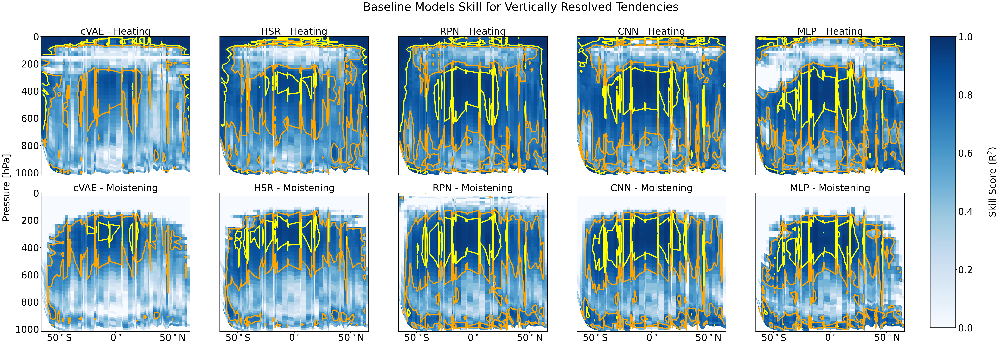

In [33]:
pred_y_l = []

import h5py
hf = h5py.File('/ocean/projects/atm200007p/shared/neurips_proj/final_metrics/predictions/cVAE/cvae_preds_bestcrps.h5', 'r')
Datasetnames=hf.keys()
n1 = hf.get('pred')
pred_y = np.array(n1)
pred_y_l.append(pred_y)

hf = h5py.File('/ocean/projects/atm200007p/shared/neurips_proj/final_metrics/predictions/HSR/hsr_preds_bestcrps.h5', 'r')
Datasetnames=hf.keys()
n1 = hf.get('pred')
pred_y = np.array(n1)
pred_y_l.append(pred_y)


pred_y = np.load(figure_ingredients + 'rpn_pred_v1_stride6.npy')
pred_y = np.array(pred_y,dtype=np.float64)
pred_y_l.append(pred_y)

pred_y = np.load(figure_ingredients + 'val_predict_cnn_reshaped_stride6_FINAL.npy')
pred_y = np.array(pred_y,dtype=np.float64)
pred_y_l.append(pred_y)

pred_y = np.load(figure_ingredients + '001_backup_phase-7_retrained_models_step2_lot-147_trial_0027.best.h5.npy')
pred_y_l.append(pred_y)

def reshape(std_test_H):
    std_test_H_heat = std_test_H[:,:60].reshape((int(std_test_H[:,:60].shape[0]/384), 384, 60))
    
    std_test_H_heat_daily = np.mean(std_test_H_heat.reshape((std_test_H_heat.shape[0]//12,12,384,60)) , axis=1) # Nday x 384 x 60
    std_test_H_moist = std_test_H[:,60:120].reshape((int(std_test_H[:,60:120].shape[0]/384), 384, 60))
    std_test_H_moist_daily = np.mean(std_test_H_moist.reshape((std_test_H_moist.shape[0]//12,12,384,60)) , axis=1) # Nday x 384 x 60
    
    std_test_H_heat_daily_long = []
    std_test_H_moist_daily_long = []
    for i in range(Nlats):
        std_test_H_heat_daily_long.append(np.mean(std_test_H_heat_daily[:,ind_lat[i],:],axis=1))
        std_test_H_moist_daily_long.append(np.mean(std_test_H_moist_daily[:,ind_lat[i],:],axis=1))
    std_test_H_heat_daily_long = np.array(std_test_H_heat_daily_long) # lat x Nday x 60
    std_test_H_moist_daily_long = np.array(std_test_H_moist_daily_long) # lat x Nday x 60
    
    return std_test_H_heat_daily_long, std_test_H_moist_daily_long

test_heat_daily_long, test_moist_daily_long = reshape(test_y)

# may need to adjust figure size if number of models considered is different from 3
fig, ax = plt.subplots(2,n_model, figsize=(n_model*12,18))
y = np.load(figure_ingredients + 'pressures_val_stride6_60lvls.npy')/100
X, Y = np.meshgrid(np.sin(lats_unique*np.pi/180), y)
Y = pg_plotgrid/100
for i in range(n_model):
    pred_heat_daily_long, pred_moist_daily_long = reshape(pred_y_l[i])
    
    
    coeff = 1 - np.sum( (pred_heat_daily_long-test_heat_daily_long)**2, axis=1)/np.sum( (test_heat_daily_long-np.mean(test_heat_daily_long, axis=1)[:,None,:])**2, axis=1)
    coeff = coeff[arg_lats_unique,:]
    coeff = coeff.T
    
    contour_plot = ax[0,i].pcolor(X, Y, coeff,cmap='Blues', vmin = 0, vmax = 1) # pcolormesh
    ax[0,i].contour(X, Y, coeff, [0.7], colors='orange', linewidths=[4])
    ax[0,i].contour(X, Y, coeff, [0.9], colors='yellow', linewidths=[4])
    ax[0,i].set_ylim(ax[0,i].get_ylim()[::-1])
    ax[0,i].set_title(model_name_l[i] + " - Heating")
    ax[0,i].set_xticks([])
    
    coeff = 1 - np.sum( (pred_moist_daily_long-test_moist_daily_long)**2, axis=1)/np.sum( (test_moist_daily_long-np.mean(test_moist_daily_long, axis=1)[:,None,:])**2, axis=1)
    coeff = coeff[arg_lats_unique,:]
    coeff = coeff.T
    
    contour_plot = ax[1,i].pcolor(X, Y, coeff,cmap='Blues', vmin = 0, vmax = 1) # pcolormesh
    ax[1,i].contour(X, Y, coeff, [0.7], colors='orange', linewidths=[4])
    ax[1,i].contour(X, Y, coeff, [0.9], colors='yellow', linewidths=[4])
    ax[1,i].set_ylim(ax[1,i].get_ylim()[::-1])
    ax[1,i].set_title(model_name_l[i] + " - Moistening")
    ax[1,i].xaxis.set_ticks([np.sin(-50/180*np.pi), 0, np.sin(50/180*np.pi)])
    ax[1,i].xaxis.set_ticklabels(['50$^\circ$S', '0$^\circ$', '50$^\circ$N'])
    ax[1,i].xaxis.set_tick_params(width = 2)
    
    if i != 0:
        ax[0,i].set_yticks([])
        ax[1,i].set_yticks([])
        
# lines below for x and y label axes are valid if 3 models are considered
# we want to put only one label for each axis
# if nbr of models is different from 3 please adjust label location to center it

#ax[1,1].xaxis.set_label_coords(-0.10,-0.10)

ax[0,0].set_ylabel("Pressure [hPa]")
ax[0,0].yaxis.set_label_coords(-0.2,-0.09) # (-1.38,-0.09)
ax[0,0].yaxis.set_ticks([1000,800,600,400,200,0])
ax[1,0].yaxis.set_ticks([1000,800,600,400,200,0])
  
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.82, 0.12, 0.02, 0.76])
cb = fig.colorbar(contour_plot, cax=cbar_ax)
cb.set_label("Skill Score "+r'$\left(\mathrm{R^{2}}\right)$',labelpad=50.1)
plt.suptitle("Baseline Models Skill for Vertically Resolved Tendencies", y = 0.97)
plt.subplots_adjust(hspace=0.13)
plt.show()

# plt.savefig('press_lat_diff_models.png', bbox_inches='tight', pad_inches=0.1 , dpi = 300)